# Calculate different performance metrics

In [1]:
import tensorflow as tf
from utils import bbox_utils, data_utils, drawing_utils, io_utils, train_utils, eval_utils
from models.decoder import get_decoder_model
from helper import label_generator
from models.ssd_mobilenet_v2 import get_model, init_model
import os
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
batch_size = 8
evaluate = False
backbone = 'mobilenet_v2'

hyper_params = train_utils.get_hyper_params(backbone)
test_data, size_info = data_utils.get_dataset("test", dir_ = "F:\Minor Data Collection\Final Image Data\Monument Original\TFRecord\\")
total_items = size_info

In [3]:
labels = label_generator.csv_to_label_map("helper\Report\ps-up-sp-BDS-alamy-merged.csv", 'list-type')
labels = ["bg"] + labels
hyper_params["total_labels"] = len(labels)
img_size = hyper_params["img_size"]

data_types = data_utils.get_data_types()
data_shapes = data_utils.get_data_shapes()
padding_values = data_utils.get_padding_values()

test_data = test_data.map(lambda x : data_utils.preprocessing(x, img_size, img_size))
test_data = test_data.padded_batch(batch_size, padded_shapes=data_shapes, padding_values=padding_values)

In [4]:
from models import header
ssd_mobilenet_model = tf.keras.models.load_model("MobileNetV2_SSD_SavedModel", custom_objects={
    "HeadWrapper": header.HeadWrapper
})

In [5]:
step_size = train_utils.get_step_size(total_items, batch_size)
pred_bboxes, pred_labels, pred_scores = ssd_mobilenet_model.predict(test_data, steps=step_size, verbose=1)

45/45 [==============================] - 21s 446ms/step


In [6]:
print(pred_bboxes.shape)

(357, 200, 4)


In [7]:
test_data, size_info = data_utils.get_dataset("test", dir_ = "F:\Minor Data Collection\Final Image Data\Monument Original\TFRecord\\")
test_data = test_data.map(lambda x : data_utils.preprocessing(x, img_size, img_size))

In [8]:
# pred_bboxes[0]

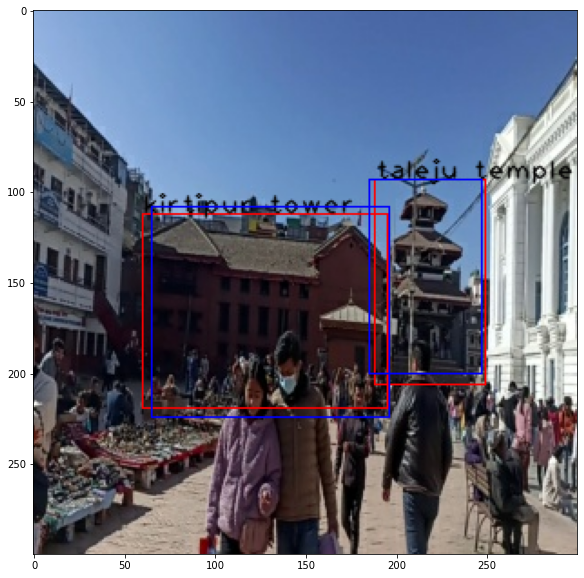

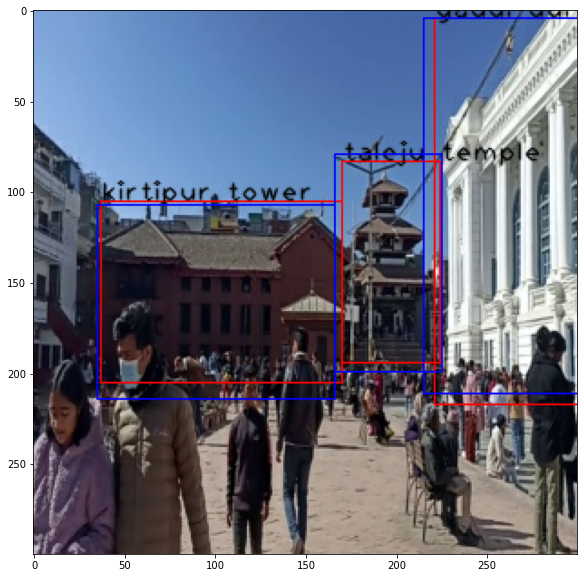

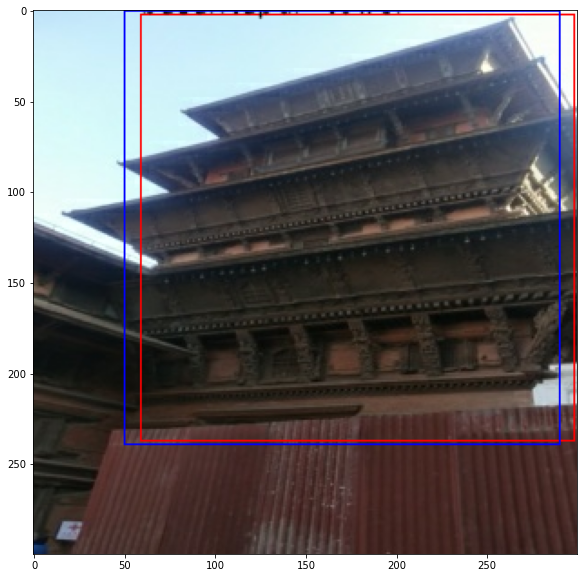

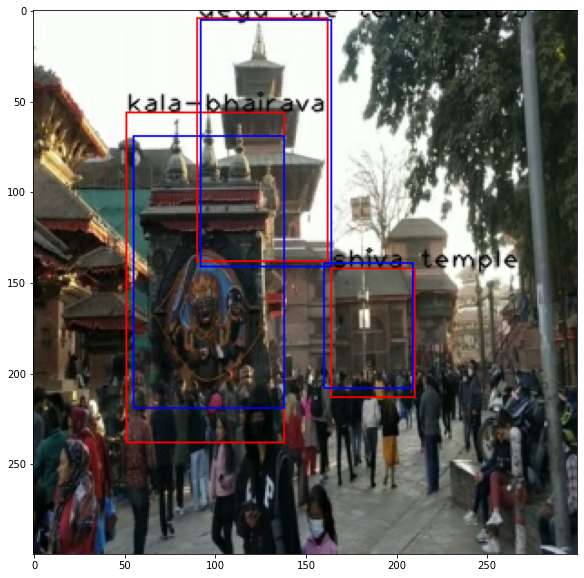

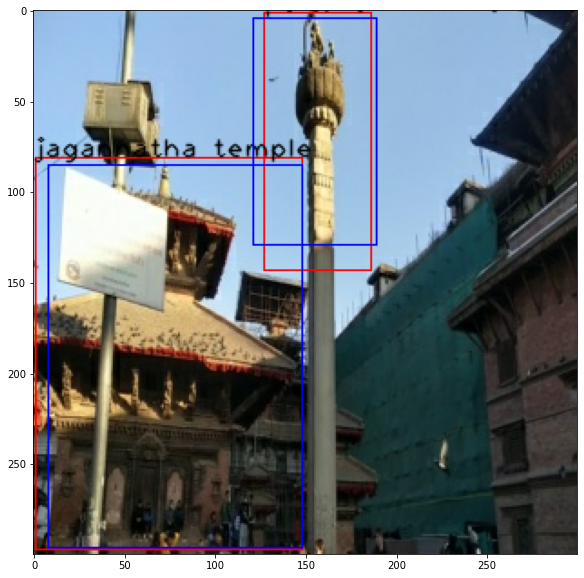

...

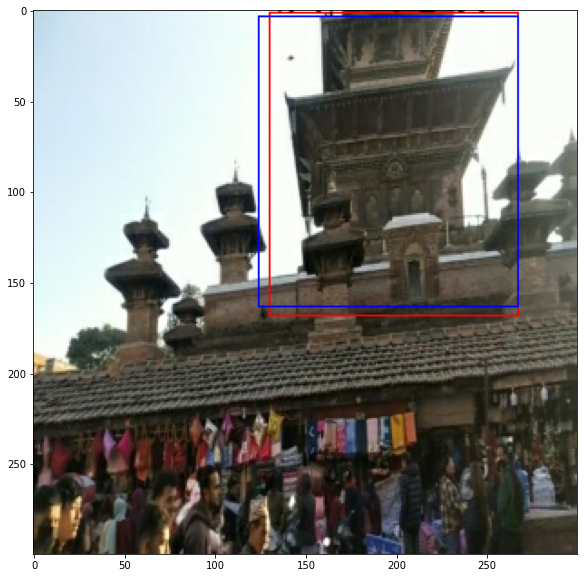

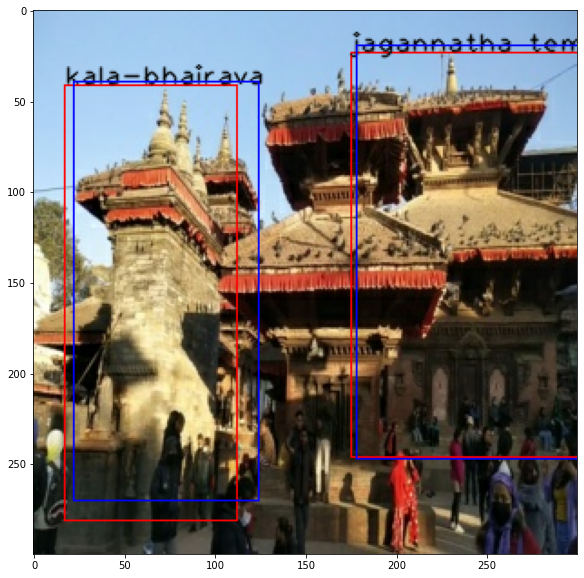

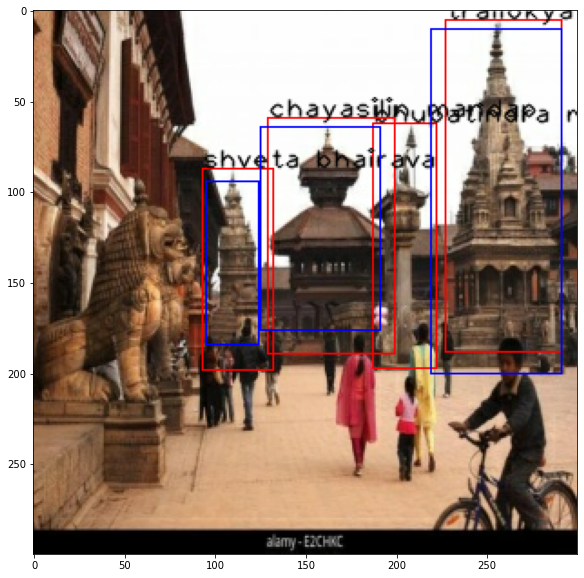

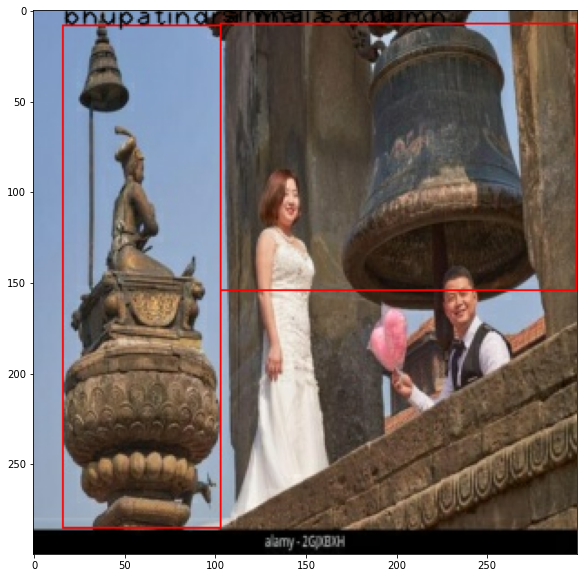

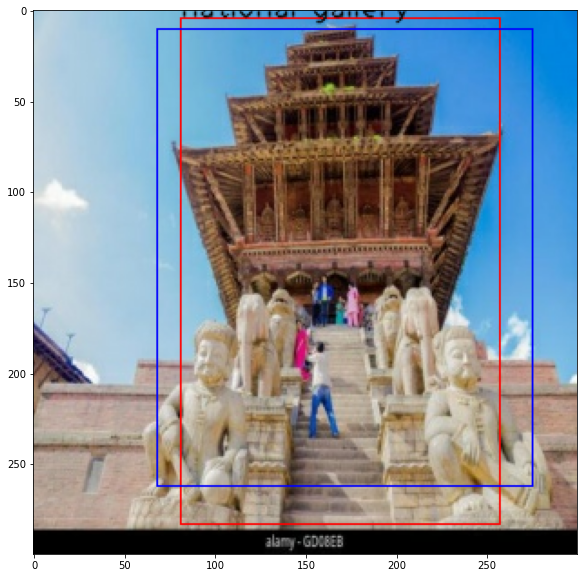

In [9]:
outer_count = 0
for index, ele in enumerate(test_data):
    #loading an image
    img_array = np.uint8(ele[0].numpy() * 255)
    
    bounding_boxes = ele[1].numpy()
    class_labels = ele[2].numpy()
    
    for count, bbox in enumerate(bounding_boxes):
        y1 = int(bbox[0] * 300)
        x1 = int(bbox[1] * 300)
        y2 = int(bbox[2] * 300)
        x2 = int(bbox[3] * 300)
        cv2.rectangle(img_array, (x1, y1), (x2, y2), (255, 0, 0), thickness = 1)
        cv2.putText(img_array, str(labels[class_labels[count]]), (x1, y1), 1, 1, (0, 0, 0), 1, cv2.LINE_AA)
    
    pred_class_labels = pred_labels[index]
    
    for count, bbox in enumerate(pred_bboxes[index]):
        if bbox[0] > 0 or bbox[1] > 0:
            y1 = int(bbox[0] * 300)
            x1 = int(bbox[1] * 300)
            y2 = int(bbox[2] * 300)
            x2 = int(bbox[3] * 300)
            cv2.rectangle(img_array, (x1, y1), (x2, y2), (0, 0, 255), thickness = 1)
#             cv2.putText(img_array, str(labels[pred_cl[count]]), (x1, y1), 1, 0, (255, 255, 0), 1, cv2.LINE_AA)
        else:
            break
    
    plt.figure(figsize = (10, 10))
    plt.imshow(img_array)
    plt.show()
    outer_count += 1
    if outer_count == 20:
        break

In [9]:
def IOU_score(pred_bbox, gt_bbox, width = 300, height = 300):
    p_y1, p_x1, p_y2, p_x2 = pred_bbox
    gt_y1, gt_x1, gt_y2, gt_x2 = gt_bbox

    p_y1, p_x1, p_y2, p_x2 = int(p_y1 * height), int(p_x1 * width), int(p_y2 * height), int(p_x2 * width)
    gt_y1, gt_x1, gt_y2, gt_x2 = int(gt_y1 * height), int(gt_x1 * width), int(gt_y2 * height), int(gt_x2 * width)
    
    area_pbox = (p_x2 - p_x1) * (p_y2 - p_y1)
    area_gtbox = (gt_x2 - gt_x1) * (gt_y2 - gt_y1)

    xx = max(p_x1, gt_x1)
    yy = max(p_y1, gt_y1)
    aa = min(p_x2, gt_x2)
    bb = min(p_y2, gt_y2)

    w = max(0, aa - xx)
    h = max(0, bb - yy)

    intersection_area = w * h

    if intersection_area == 0:
        return None
    union_area = area_pbox + area_gtbox - intersection_area
    return float(intersection_area) / float(union_area)

In [10]:
print(np.arange(0.5, 0.96, 0.05))

[0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95]


In [76]:
precision_list = []
recall_list = []
def PR_Curve():
    for iou_theshold in np.arange(0.5, 0.96, 0.05).tolist():
        image_no = 0
        data_list = []
        accumulated_TP = 0
        accumulated_FP = 0
        gt_ROIs = 0
        for index, ele in enumerate(test_data):
            gt_ind_ROI = 0
            image_name = 'Image ' + str(image_no)

            bounding_boxes = ele[1].numpy()
            class_labels = ele[2].numpy()

            predicted_pred_bboxes = pred_bboxes[index]
            pred_class_labels = pred_labels[index]
            pred_conf_scores = pred_scores[index]

            for _ in class_labels:
                gt_ind_ROI += 1
            gt_ROIs += gt_ind_ROI

            detected_count = 0
            for bbox in predicted_pred_bboxes:
                if bbox[0] > 0 or bbox[1] > 0 or bbox[2] > 0 or bbox[3] > 0:
                    detected_count += 1
                else:
                    break
            for i in range(detected_count):
                tp = 0
                fp = 0
                if pred_class_labels[i] in class_labels:
                    class_label_index = class_labels.tolist().index(pred_class_labels[i])
                    if IOU_score(predicted_pred_bboxes[i], bounding_boxes[class_label_index]) > iou_theshold:
                        tp = 1
                        accumulated_TP += 1
                    else:
                        fp = 1 
                        accumulated_FP += 1
                else:
                    fp = 1
                    accumulated_FP += 1
                precision = float(accumulated_TP) / (float(accumulated_TP) + float(accumulated_FP))
                recall = float(accumulated_TP) / 694.0
                data_list.append((image_name, labels[int(pred_class_labels[i])], pred_conf_scores[i] * 100, tp, fp, detected_count))

            image_no += 1

        column_name = ['Image', 'Detections', 'Confidence %', "TP", "FP", 'detected_count']
        df = pd.DataFrame(data_list, columns = column_name)

        df.sort_values(['Confidence %'], inplace = True, ignore_index=True, ascending = False)

        new_data_list = list()
        accumulated_TP = 0
        accumulated_FP = 0

        for row in df.iterrows():
            if row[1]['TP'] == 1:
                accumulated_TP += 1
            elif row[1]['FP'] == 1:
                accumulated_FP += 1
            precision = float(accumulated_TP) / (float(accumulated_TP) + float(accumulated_FP))
            recall = float(accumulated_TP) / gt_ROIs
            new_data_list.append((row[1]['Image'], row[1]['Detections'], row[1]['Confidence %'], row[1]['TP'], row[1]['FP'], accumulated_TP, accumulated_FP, precision, recall))

        column_name = ['Image', 'Detections', 'Confidence %', "TP", "FP", 'Acc TP', 'Acc FP', 'Precision', 'Recall']
        new_df = pd.DataFrame(new_data_list, columns = column_name)
        
        precision_list.append(new_df['Precision'])
        recall_list.append(new_df['Recall'])
        
#         plt.figure(figsize = (16, 8), dpi = 240)
#         plt.style.use('seaborn-whitegrid')
#         plt.plot(new_df['Recall'], new_df['Precision'])
#         plt.scatter(new_df['Recall'], new_df['Precision'], s = 10)
#         font = {'color': 'black', 'size': 16, 'weight': 'bold'}
#         plt.xlabel('Recall', fontdict = font)
#         plt.ylabel('Precision', fontdict = font)
#         plt.title(f'Precision x Recall Curve (IoU Threshold: {iou_theshold})', font)
#         plt.show()

In [77]:
PR_Curve()

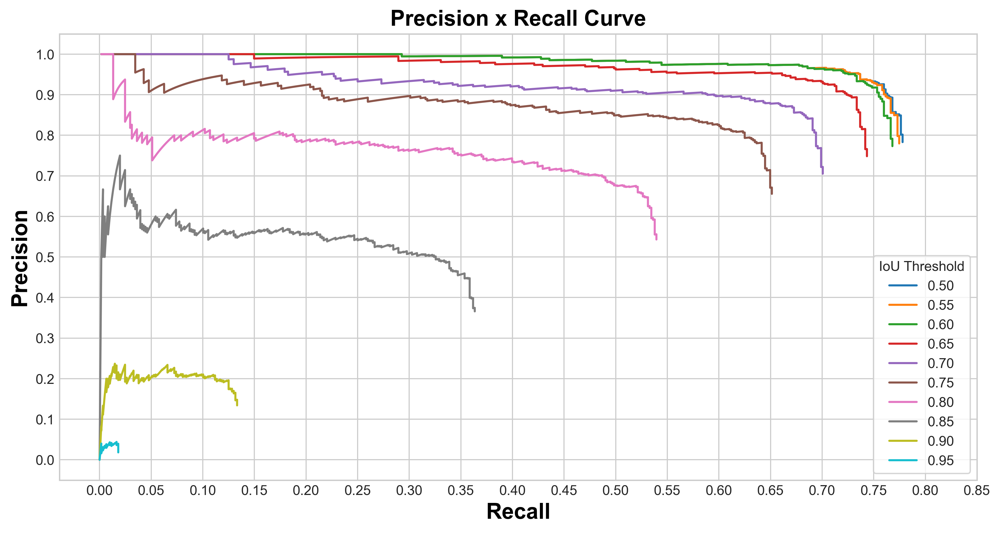

In [83]:
plt.figure(figsize = (12, 6), dpi = 360)
plt.style.use('seaborn-whitegrid')
font = {'color': 'black', 'size': 16, 'weight': 'bold'}
threshold_range = np.arange(0.5, 0.96, 0.05)

for i in range(len(precision_list)):
    plt.plot(recall_list[i], precision_list[i], label = "%.2f" % threshold_range[i])
#     plt.scatter(recall_list[i], precision_list[i], s = 8)
    plt.xlabel('Recall', fontdict = font)
    plt.ylabel('Precision', fontdict = font)
    plt.title(f'Precision x Recall Curve', font)
plt.legend(loc = 'lower right', title = 'IoU Threshold', frameon = True)
plt.xticks(np.arange(0, 0.9, 0.05))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.savefig("Precision x Recall Curve-0.5 to 0.95.jpg", dpi = 360, bbox_inches = 'tight', pad_inches = 0.3)
plt.show()

# Find Average Precision (AP) calculation: 
# Using 11 Point Interpolation Technique

In [108]:
import math
def calculate_p(rv, hp, lp, hr, lr):
    value = lp + ((hp-lp)/(hr-lr)) * (rv - lr)
    if math.isinf(value):
        return lp
    else:
        return value

In [115]:
eleven_point = np.arange(0.0, 1.1, 0.1).tolist()

output_AP_list = list()
for i in range(len(precision_list)):
    list_size = len(precision_list[i])
    
    points_precision_val = list()
    for interpolation_point in eleven_point:
        for val_index in range(list_size):
            if recall_list[i][val_index] > interpolation_point:
                if val_index == 0:
                    points_precision_val.append(precision_list[i][val_index])
                    break
                else:
                    recall_value = interpolation_point
                    high_p = precision_list[i][val_index]
                    low_p = precision_list[i][val_index - 1]
                    high_r = recall_list[i][val_index]
                    low_r = recall_list[i][val_index - 1]
                    points_precision_val.append(calculate_p(recall_value, high_p, low_p, high_r, low_r))
                    break
    output_AP_list.append(np.sum(np.array(points_precision_val)) / 11)

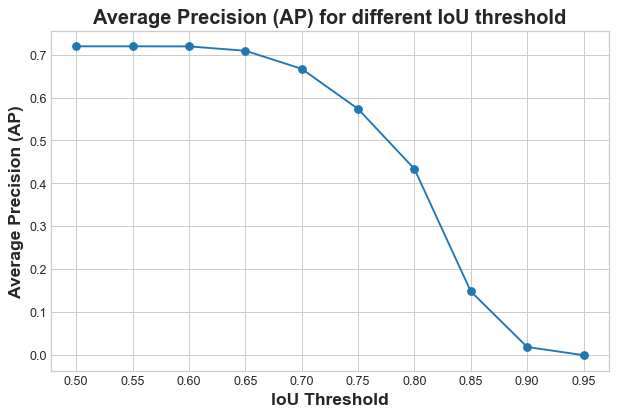

In [137]:
plt.figure(figsize = (8, 5), dpi = 90)
plt.plot(np.arange(0.5, 0.96, 0.05), output_AP_list)
plt.scatter(np.arange(0.5, 0.96, 0.05), output_AP_list, )

plt.xticks(np.arange(0.5, 0.96, 0.05))
plt.yticks(np.arange(0.0, 0.8, 0.1))
font_title = {'size': 16, 'weight': 'bold'}
font_label = {'size': 14, 'weight': 'bold'}

plt.title('Average Precision (AP) for different IoU threshold', fontdict = font_title)
plt.xlabel('IoU Threshold', fontdict = font_label)
plt.ylabel('Average Precision (AP)', fontdict = font_label)
plt.savefig("Average Precision(AP) for different IoU threshold.jpg", dpi = 90, bbox_inches = 'tight', pad_inches = 0.3)
plt.show()

## Calculate AP score for each individual class

In [327]:
def get_mn_dataframe(threshold = 0.5):
    
    gt_ROIs = 0
    accumulated_TP = 0
    accumulated_FP = 0
    data_list = list()
    image_no = 0
    iou_threshold = threshold # From AP vs IoU threshold curve

    for index, ele in enumerate(test_data):
        gt_ind_ROI = 0
        image_name = 'Image ' + str(image_no)
        # Ground truth bboxes
        bounding_boxes = ele[1].numpy()
        # Ground truth class labels
        class_labels = ele[2].numpy()
        # Predicted bboxes
        predicted_pred_bboxes = pred_bboxes[index]
        # Predicted class labels
        pred_class_labels = pred_labels[index]
        # Predicted confidence scores
        pred_conf_scores = pred_scores[index]
        # Finding total gt-bboxes ROIs
        for _ in class_labels:
            gt_ind_ROI += 1
        gt_ROIs += gt_ind_ROI
        # Finding number of predictions carried out by the model
        detected_count = 0
        for bbox in predicted_pred_bboxes:
            if bbox[0] > 0 or bbox[1] > 0 or bbox[2] > 0 or bbox[3] > 0:
                detected_count += 1
            else:
                break
        for i in range(detected_count):
            tp = 0
            fp = 0
            if pred_class_labels[i] in class_labels:
                class_label_index = class_labels.tolist().index(pred_class_labels[i])
                if IOU_score(predicted_pred_bboxes[i], bounding_boxes[class_label_index]) > iou_threshold:
                    tp = 1
                    accumulated_TP += 1
                else:
                    fp = 1 
                    accumulated_FP += 1
            else:
                fp = 1
                accumulated_FP += 1
            precision = float(accumulated_TP) / (float(accumulated_TP) + float(accumulated_FP))
            recall = float(accumulated_TP) / 694.0
            data_list.append((image_name, labels[int(pred_class_labels[i])], pred_conf_scores[i] * 100, tp, fp))

        image_no += 1

    column_name = ['Image', 'Detection', 'Confidence', "TP", "FP"]
    df = pd.DataFrame(data_list, columns = column_name)
    return df


In [328]:
def dataframe_to_mn_dict(threshold):
    mn_dict = dict()
    for row in get_mn_dataframe(threshold).iterrows():
        mn_class = row[1]['Detection']
        mn_conf_score = row[1]['Confidence']
        tp = row[1]['TP']
        fp = row[1]['FP']

        if mn_class in list(mn_dict.keys()):
            mn_dict[mn_class]['conf_scores'].append(mn_conf_score)
            mn_dict[mn_class]['tp'].append(tp)
            mn_dict[mn_class]['fp'].append(fp)
        else:
            temp_dict = {
                'conf_scores': [mn_conf_score],
                'tp': [tp],
                'fp': [fp]
            }
            mn_dict[mn_class] = temp_dict 
    return mn_dict


In [331]:
# sub_plot_count = 1
# img_batch_plot = 1
# font_title = {'size': 14, 'weight' : 'bold'}

def calculate_mAP(threshold):
    mn_dict = dataframe_to_mn_dict(threshold)
    for mn_class, mn_info in mn_dict.items():
        column_names = ['conf_scores', 'tp', 'fp']
        temp_df = pd.DataFrame(zip(mn_info['conf_scores'], mn_info['tp'], mn_info['fp']), columns = column_names)
        temp_df.sort_values(['conf_scores'], inplace = True, ignore_index = True, ascending = False)
        gt_ROI = len(list(temp_df['conf_scores']))

        acc_tp = 0
        acc_fp = 0

        precision_list = list()
        recall_list = list()
        for row in temp_df.iterrows():
            if row[1]['tp'] == 1:
                acc_tp += 1
            elif row[1]['fp'] == 1:
                acc_fp += 1
            precision_list.append(float(acc_tp) / (float(acc_tp) + float(acc_fp)))
            recall_list.append(float(acc_tp) / gt_ROI)

        # Calculating AP value for each monument class

        list_size = len(precision_list)
        points_precision_val = list()
        eleven_point = np.arange(0.0, 1.1, 0.1).tolist()
        for interpolation_point in eleven_point:
            for val_index in range(list_size):
                if recall_list[val_index] > interpolation_point:
                    if val_index == 0:
                        points_precision_val.append(precision_list[val_index])
                        break
                    else:
                        recall_value = interpolation_point
                        high_p = precision_list[val_index]
                        low_p = precision_list[val_index - 1]
                        high_r = recall_list[val_index]
                        low_r = recall_list[val_index - 1]
                        points_precision_val.append(calculate_p(recall_value, high_p, low_p, high_r, low_r))
                        break
        mn_dict[mn_class]['AP'] = np.sum(np.array(points_precision_val)) / 11
    mAP_score = 0
    total_mn_class = len(list(mn_dict.keys()))
    for _, mn_info in mn_dict.items():
        mAP_score += mn_info['AP']
    return (mAP_score / total_mn_class)



In [346]:
iou_threshold_range = np.arange(0.1, 0.96, 0.05).tolist()
map_scores_list = list()

for threshold in iou_threshold_range:
    map_score = calculate_mAP(threshold)
    map_scores_list.append(map_score)
    print(f"mAP Score at threshold: {threshold} is {map_score}")


mAP Score at threshold: 0.1 is 0.7445887106809722
mAP Score at threshold: 0.15000000000000002 is 0.7445887106809722
mAP Score at threshold: 0.20000000000000004 is 0.7445887106809722
mAP Score at threshold: 0.25000000000000006 is 0.7445887106809722
mAP Score at threshold: 0.30000000000000004 is 0.7445887106809722
mAP Score at threshold: 0.3500000000000001 is 0.742948867270794
mAP Score at threshold: 0.40000000000000013 is 0.742948867270794
mAP Score at threshold: 0.45000000000000007 is 0.7427591602835663
mAP Score at threshold: 0.5000000000000001 is 0.7288661763431833
mAP Score at threshold: 0.5500000000000002 is 0.7251206037339742
mAP Score at threshold: 0.6000000000000002 is 0.7217287452496307
mAP Score at threshold: 0.6500000000000001 is 0.6877453200420257
mAP Score at threshold: 0.7000000000000002 is 0.6425411173747967
mAP Score at threshold: 0.7500000000000002 is 0.5700638298452726
mAP Score at threshold: 0.8000000000000002 is 0.4483248255767885
mAP Score at threshold: 0.8500000000

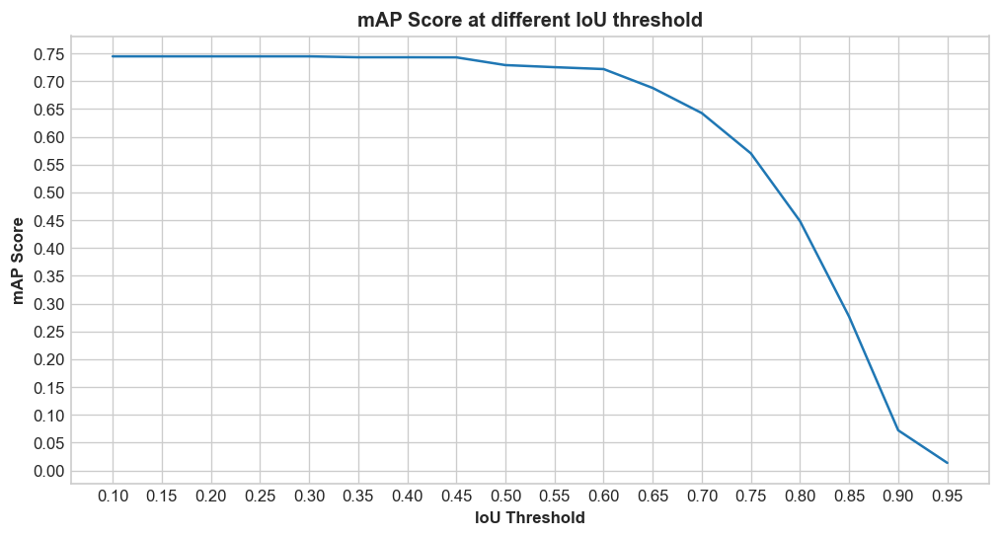

In [352]:
plt.figure(figsize = (10, 5), dpi = 120)
plt.plot(iou_threshold_range, map_scores_list)
plt.xticks(iou_threshold_range)
plt.yticks(np.arange(0.0, 0.8, 0.05))

plt.title('mAP Score at different IoU threshold', fontdict = {'size': 12, 'weight': 'bold'})
plt.xlabel('IoU Threshold', fontdict = {'size': 10, 'weight': 'bold'})
plt.ylabel('mAP Score', fontdict = {'size': 10, 'weight': 'bold'})
save_loc = "./Curves and Graphs/mAP Scores at different IoU threshold.jpg"
plt.savefig(save_loc, dpi = 160, bbox_inches = 'tight', pad_inches = 0.2)
plt.show()

## AUC-ROC Curve

In [ ]:
# Plotting PR curves for each monument classes

# plt.subplot(2, 4, sub_plot_count)
# plt.plot(recall_list, precision_list)
# plt.title(f"''{mn_class}''", fontdict = font_title)
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# sub_plot_count += 1
# if sub_plot_count == 9:
#     save_loc = f"./Curves and Graphs/{img_batch_plot}_PR_Curve.png"
#     plt.subplots_adjust(left=0.125,
#                 bottom=0.1, 
#                 right=1.0, 
#                 top=0.9, 
#                 wspace=0.2, 
#                 hspace=0.35)

#     plt.savefig(save_loc, dpi = 90, bbox_inches = 'tight', pad_inches = 0.2)
#     plt.figure(figsize = (16, 8), dpi = 90)
#     sub_plot_count = 1
#     img_batch_plot += 1

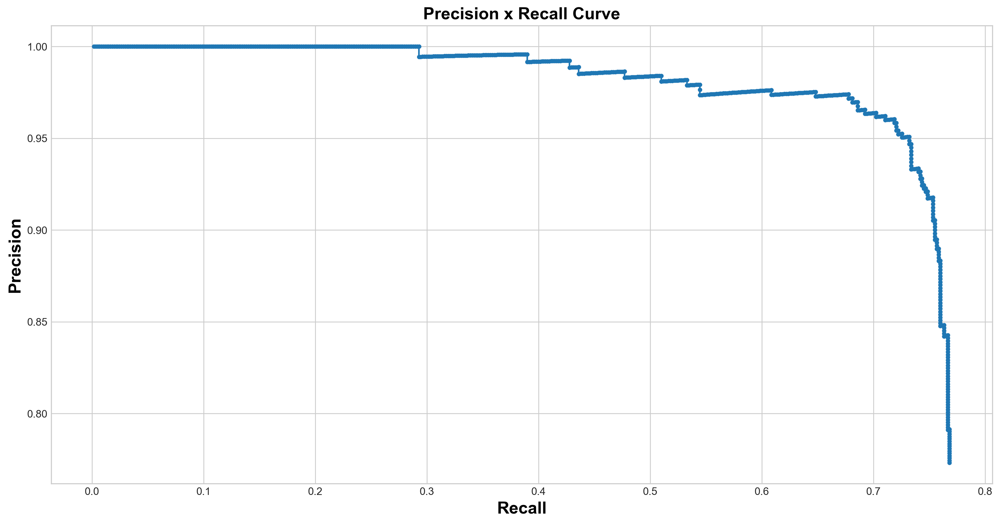

In [25]:
# plt.figure(figsize = (16, 8), dpi = 240)
# plt.style.use('seaborn-whitegrid')
# plt.plot(new_df['Recall'], new_df['Precision'])
# plt.scatter(new_df['Recall'], new_df['Precision'], s = 10)
# font = {'color': 'black', 'size': 16, 'weight': 'bold'}
# plt.xlabel('Recall', fontdict = font)
# plt.ylabel('Precision', fontdict = font)
# plt.title('Precision x Recall Curve', font)
# # plt.savefig('precision_recall_curve.jpg', dpi = 480, bbox_inches = 'tight', pad_inches = 0.4)
# plt.show()